# Pseudotime and RNA velocity for in vivo SI data 

In [1]:
import scanpy as sc
import scvelo as scv
import pandas as pd
from matplotlib import pyplot as plt
import rpy2.rinterface_lib.callbacks
import logging
from rpy2.robjects import pandas2ri
import anndata2ri
import numpy as np

/usr/local/lib/python3.6/dist-packages/numba/errors.py:104: UserWarning: Insufficiently recent colorama version found. Numba requires colorama >= 0.3.9
  warnings.warn(msg)


In [2]:
# Ignore R warning messages
#Note: this can be commented out to get more verbose R output
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

# Automatically convert rpy2 outputs to pandas dataframes
pandas2ri.activate()
anndata2ri.activate()
%load_ext rpy2.ipython

plt.rcParams['figure.figsize']=(8,8) #rescale figures
sc.settings.verbosity = 3
#sc.set_figure_params(dpi=200, dpi_save=300)
sc.logging.print_versions()

scanpy==1.4.4.post1 anndata==0.6.22.post1 umap==0.3.7 numpy==1.17.3 scipy==1.3.1 pandas==0.23.4 scikit-learn==0.21.3 statsmodels==0.10.1 python-igraph==0.7.1 louvain==0.6.1


In [3]:
%%R

#Load R libraries
library(scran)
library(RColorBrewer)
library(slingshot)
library(SingleCellExperiment)

In [2]:
#read in data
adata = sc.read("../../output/adata_anno.h5ad")

In [8]:
#create copy with cell cycle difference regressed out
adata_cc = adata.copy()
sc.pp.regress_out(adata_cc, 'cc_dif')
sc.tl.pca(adata_cc, svd_solver='arpack')

regressing out cc_dif
    finished (0:01:28)
computing PCA with n_comps = 50
computing PCA on highly variable genes
    finished (0:00:02)


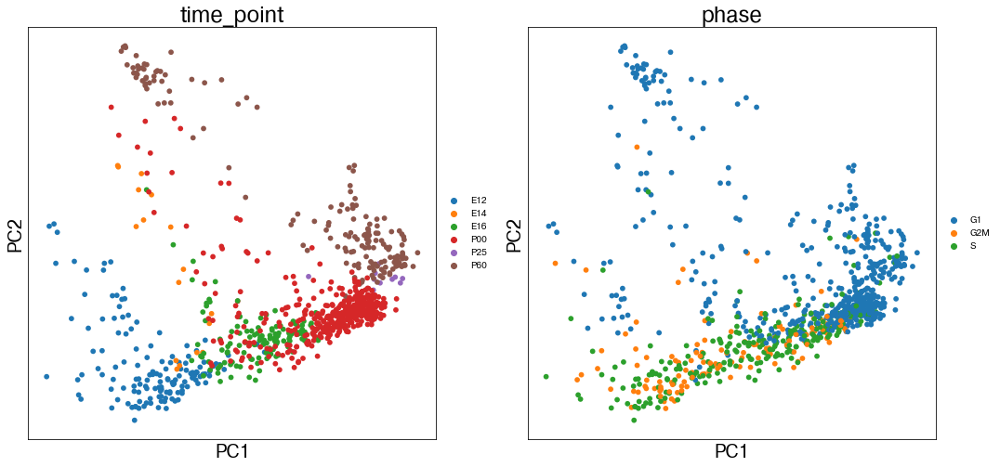

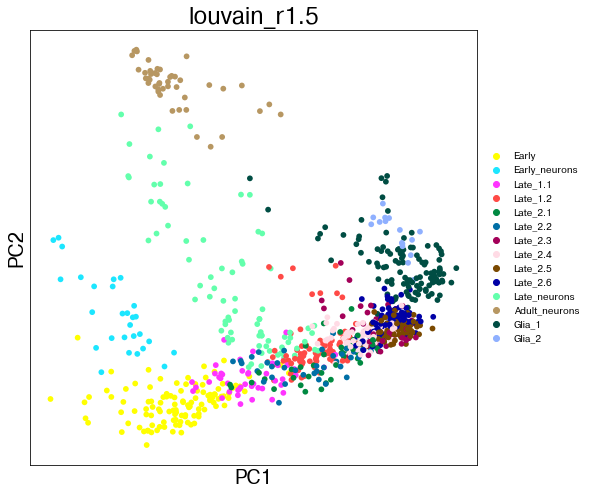

In [32]:
#visualise PCA
sc.pl.pca(adata_cc, color=['time_point','phase'])
sc.pl.pca(adata_cc, color=['louvain_r1.5'])

In [31]:
adata_cc.obsm["X_pca"][:,0] = -adata_cc.obsm["X_pca"][:,0]

In [33]:
#create a copy of adata_cc for RNA velocity calculation
adata_velo = adata_cc.copy()

#normalise spliced and unspliced read counts and filter for gene module
#genes
scv.pp.filter_and_normalize(adata_velo,min_counts=20, min_counts_u=10)
adata_velo = adata_velo[:,adata_velo.var.highly_variable]

Filtered out 503 genes that are detected in less than 20 counts (spliced).
Filtered out 5463 genes that are detected in less than 10 counts (unspliced).
Normalized count data: spliced, unspliced.


computing neighbors
    finished (0:00:00) --> added to `.uns['neighbors']`
    'distances', weighted adjacency matrix
    'connectivities', weighted adjacency matrix
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of spliced/unspliced abundances (adata.layers)
computing velocities
    finished (0:00:05) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:00:04) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_pca', embedded velocity vectors (adata.obsm)
saving figure to file ./figures/scvelo_velocity_clusters.png


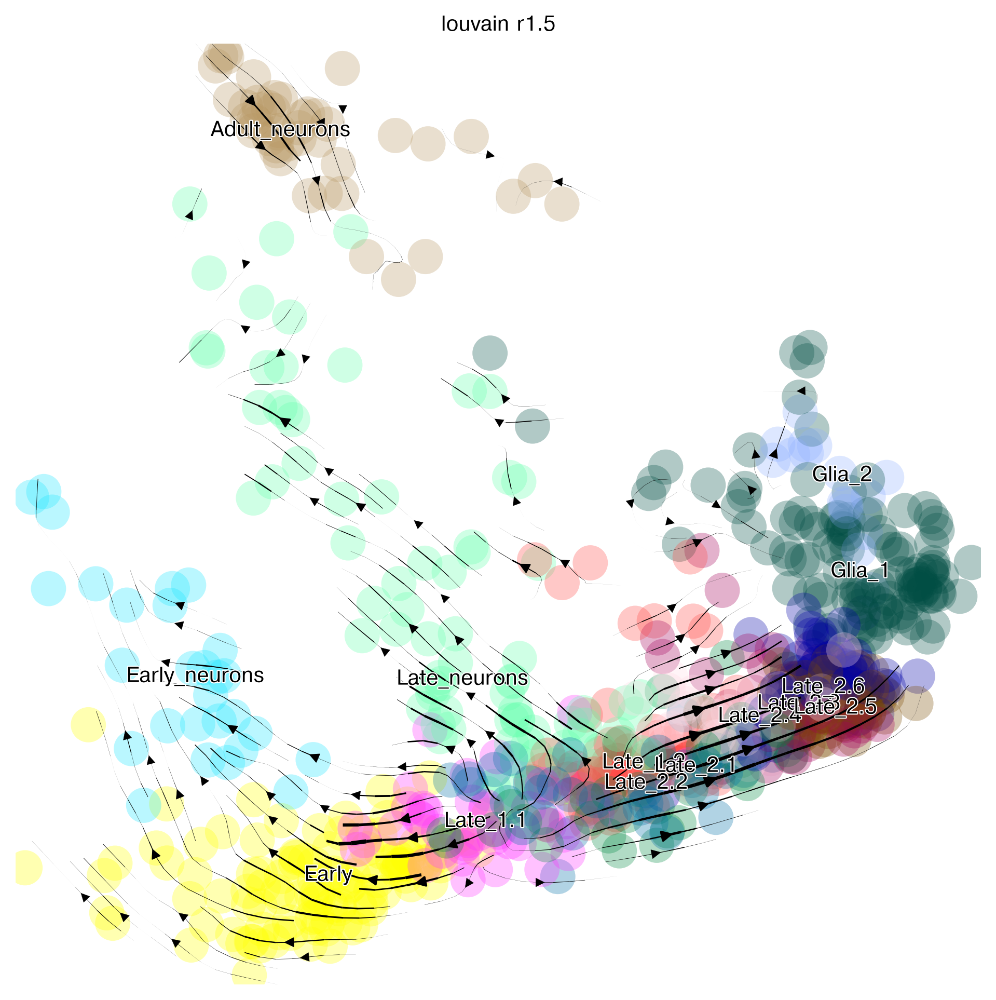

saving figure to file ./figures/scvelo_velocity_clusters_v2.png


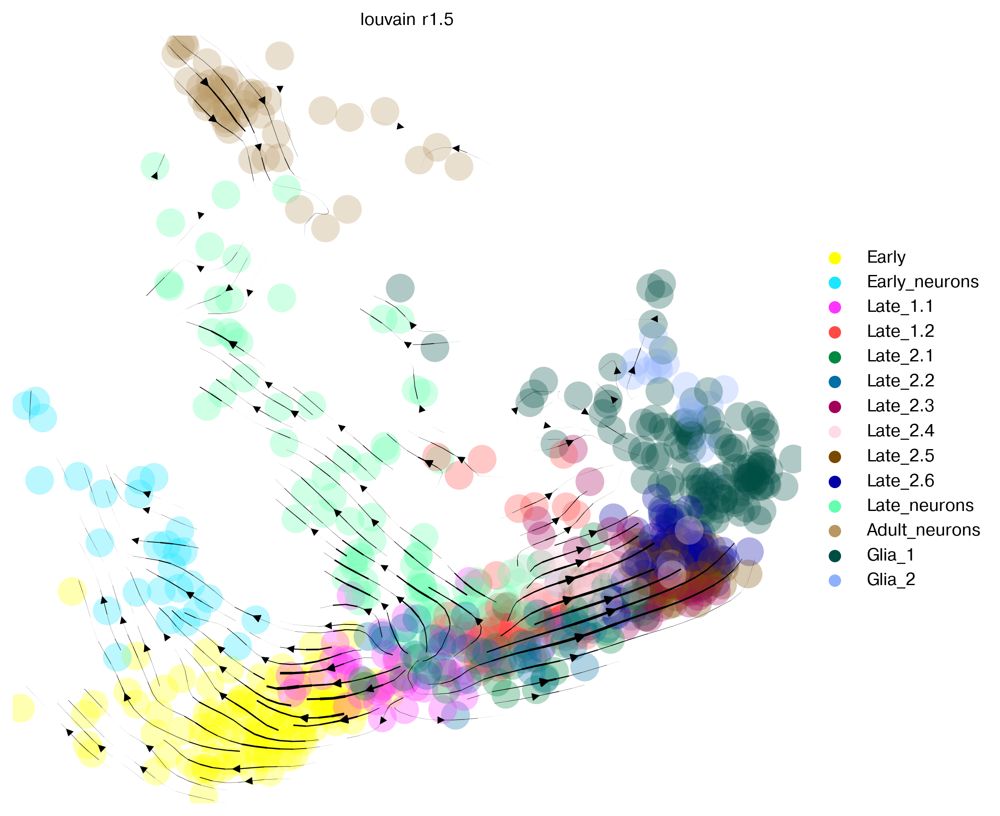

In [34]:
#compute RNA velocity
scv.pp.moments(adata_velo)
scv.tl.velocity(adata_velo, mode='stochastic')
scv.tl.velocity_graph(adata_velo)

plt.rcParams.update({'font.size': 10,'legend.fontsize':10})
scv.pl.velocity_embedding_stream(adata_velo,basis = "pca", legend_loc='on data', color = 'louvain_r1.5',\
                                 dpi = 300, save = "velocity_clusters.png")
scv.pl.velocity_embedding_stream(adata_velo,basis = "pca",legend_loc='right margin', color = 'louvain_r1.5',\
                                 dpi = 300, save = "velocity_clusters_v2.png")

In [35]:
#merge all late 1 clusters and merge all late 2 clusters and merge adult glial clusterse
adata_velo.obs["louvain_semisup"] = list(adata.obs["louvain_r1.5"])
adata_velo.obs["louvain_semisup"][adata_velo.obs["louvain_semisup"].isin(['Late_2.1','Late_2.2','Late_2.3','Late_2.4','Late_2.5','Late_2.6'])] = "Late_2"
adata_velo.obs["louvain_semisup"][adata_velo.obs["louvain_semisup"].isin(['Late_1.1','Late_1.2'])] = "Late_1"
#adata.obs["louvain_semisup"][adata.obs["louvain_semisup"].isin(['Glia_1','Glia_2'])] = "Glia"

In [36]:
adata_velo.obs['louvain_semisup'] = pd.Categorical(adata_velo.obs['louvain_semisup'], 
                     categories=["Early", "Early_neurons", "Late_1", "Late_2", "Late_neurons","Adult_neurons","Glia_1", "Glia_2"],
                    ordered=True)
new_cluster_names = ["eEP", "eENP", "lEP1", "lEP2", "lENP","ENC","EGC1", "EGC2"]
adata_velo.rename_categories('louvain_semisup', new_cluster_names)

In [37]:
#set plotting parameters
plt.rcParams['figure.figsize']=(8,8)
plt.rcParams['font.sans-serif'] = "Helvetica"
# Then, "ALWAYS use sans-serif fonts"
plt.rcParams['font.family'] = "sans-serif"
plt.rcParams.update({'font.size': 20})

saving figure to file ./figures/scvelo_velocity_semisup.png


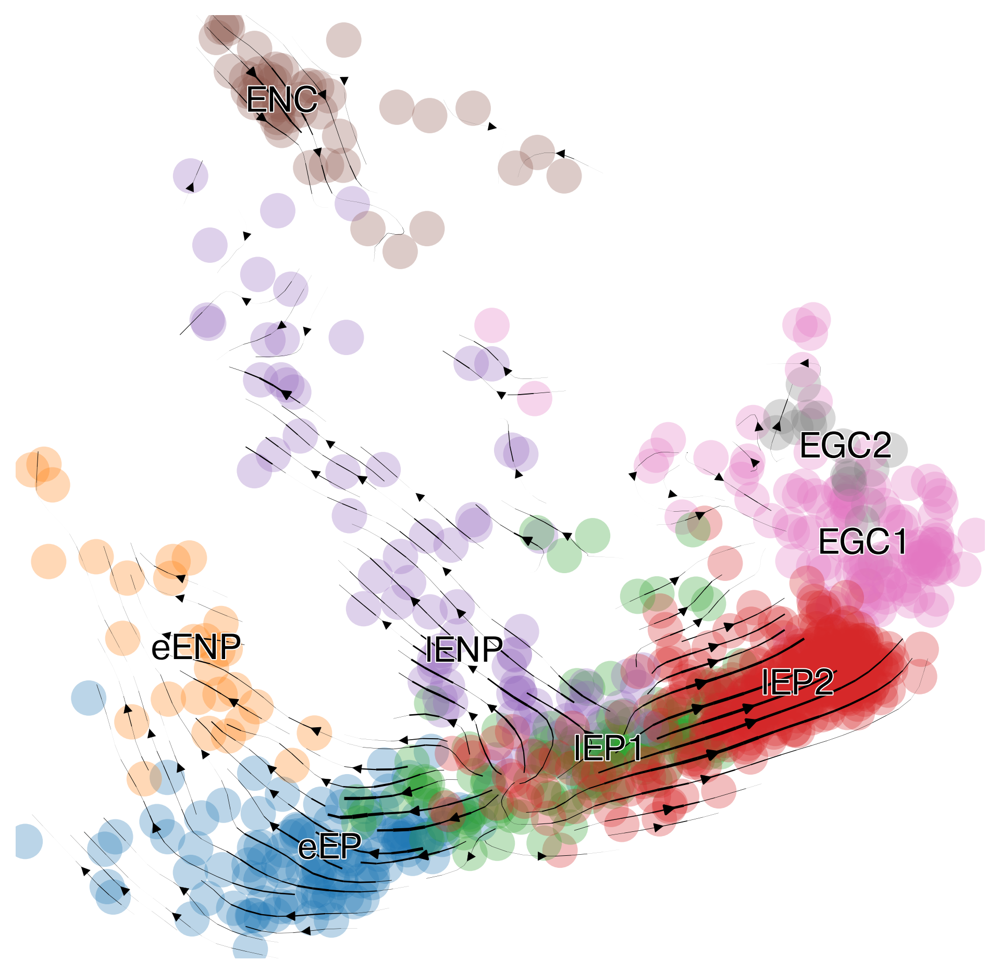

In [38]:
scv.pl.velocity_embedding_stream(adata_velo,basis = "pca", legend_loc='on data',legend_fontsize = 'small', title = "", color = 'louvain_semisup', dpi = 300,\
                                 save = "velocity_semisup.png")

In [41]:
adata_velo.write("../../output/adata_velo.h5ad")

In [4]:
adata_velo.obs['louvain_semisup'] = pd.Categorical(adata_velo.obs['louvain_semisup'], 
                     categories=["eEP", "eENP", "lEP1", "lEP2", "lENP","ENC","EGC1", "EGC2"],
                    ordered=True)
new_cluster_names = ["eEP", "eENP", "lEP1", "lEP2", "lENP","EN","EGC1", "EGC2"]
adata_velo.rename_categories('louvain_semisup', new_cluster_names)

saving figure to file ./figures/scvelo_velocity_semisup.png


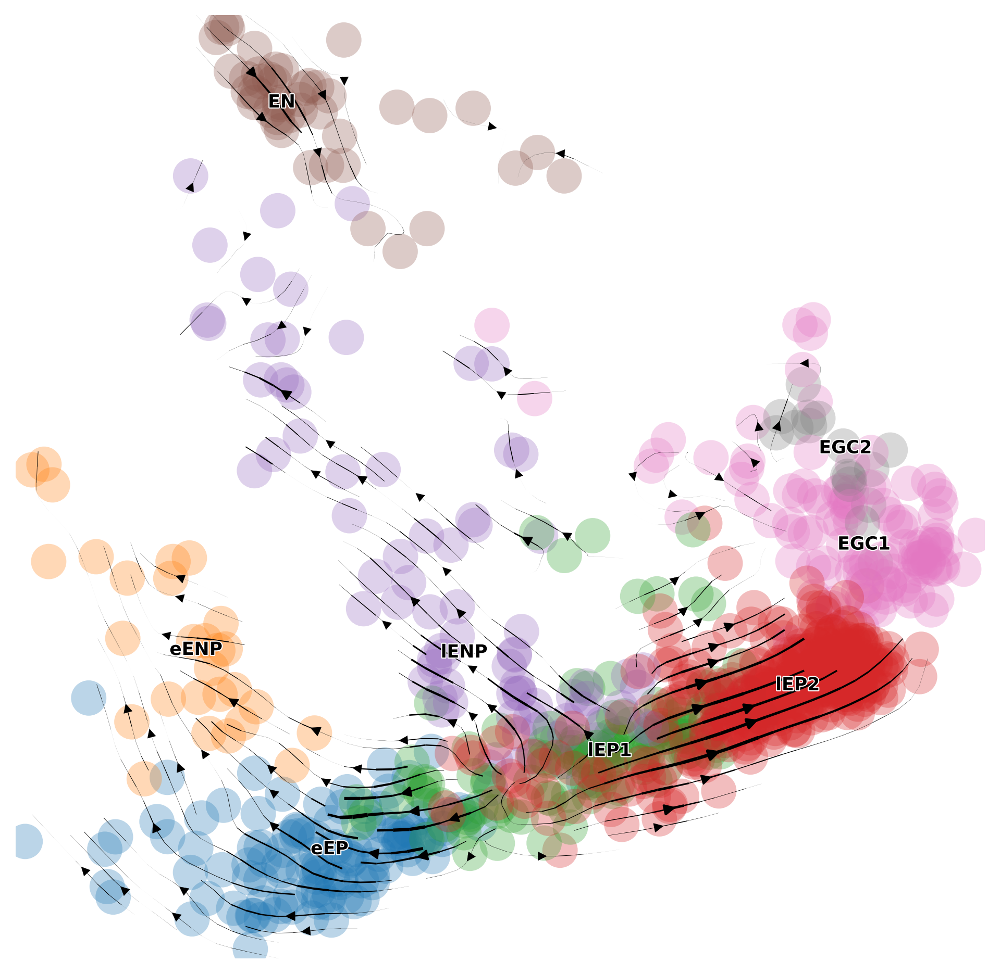

In [6]:
scv.pl.velocity_embedding_stream(adata_velo,basis = "pca", legend_loc='on data',legend_fontsize = 'small', title = "", color = 'louvain_semisup', dpi = 300,\
                                 save = "velocity_semisup.png")

saving figure to file ./figures/scvelo_velocity_timepoint.png


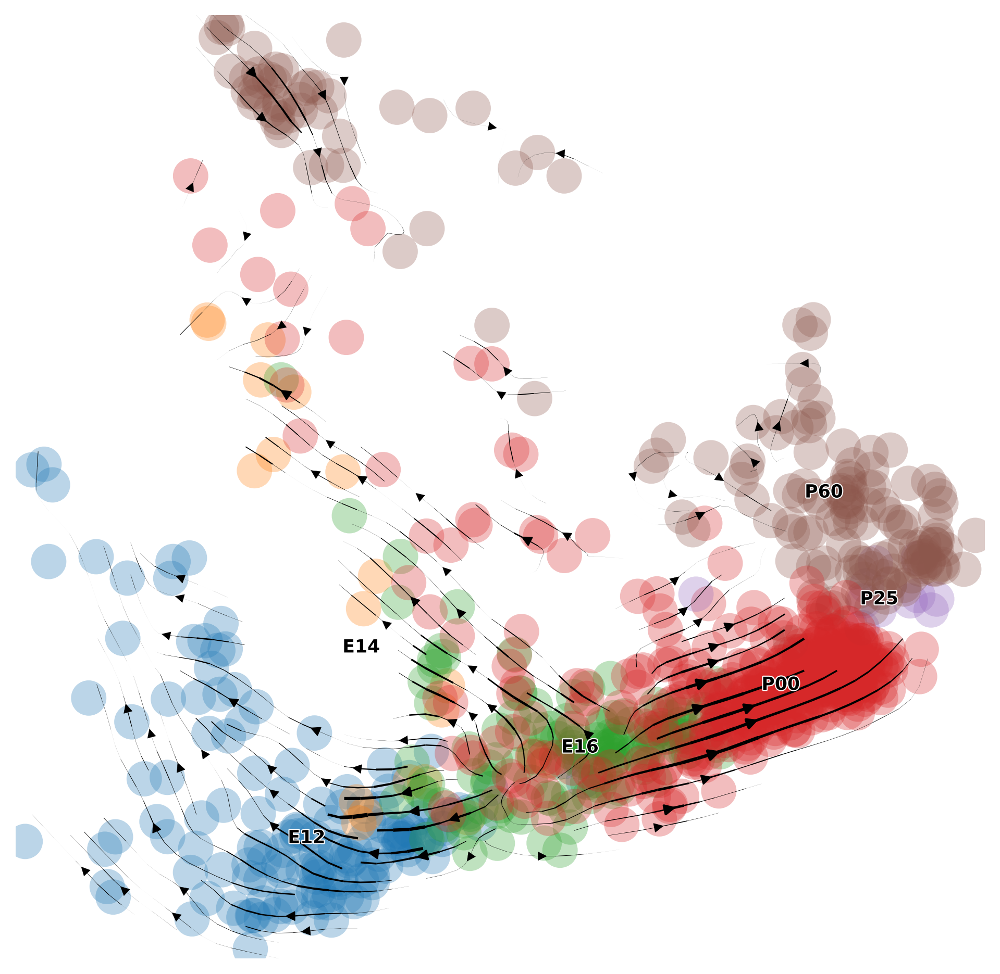

In [5]:
scv.pl.velocity_embedding_stream(adata_velo,basis = "pca", legend_loc='on data',legend_fontsize = 'small', title = "", color = 'time_point', dpi = 300,\
                                 save = "velocity_timepoint.png")

saving figure to file ./figures/scvelo_velocity_timepoint_no_labels.png


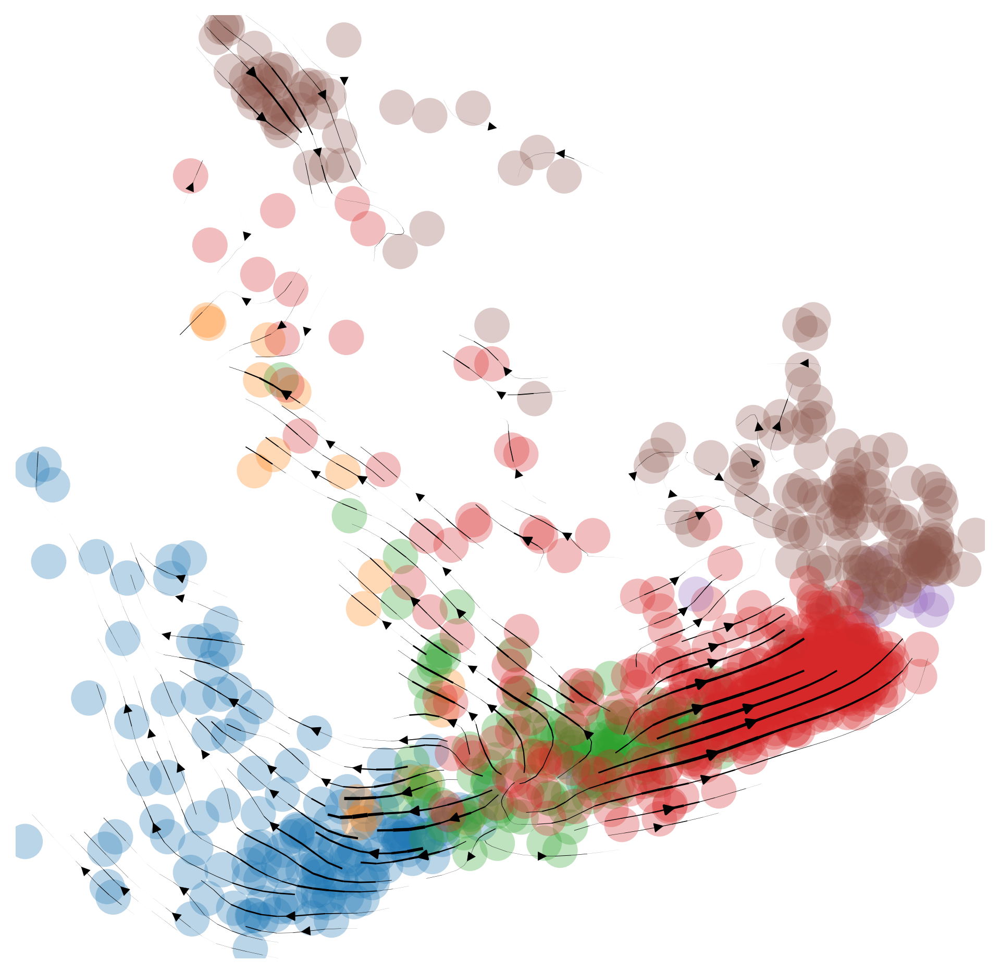

In [6]:
scv.pl.velocity_embedding_stream(adata_velo,basis = "pca", legend_loc='',legend_fontsize = 'small', title = "", color = 'time_point', dpi = 300,\
                                 save = "velocity_timepoint_no_labels.png")

saving figure to file ./figures/scvelo_velocity_semisup_no_labels.png


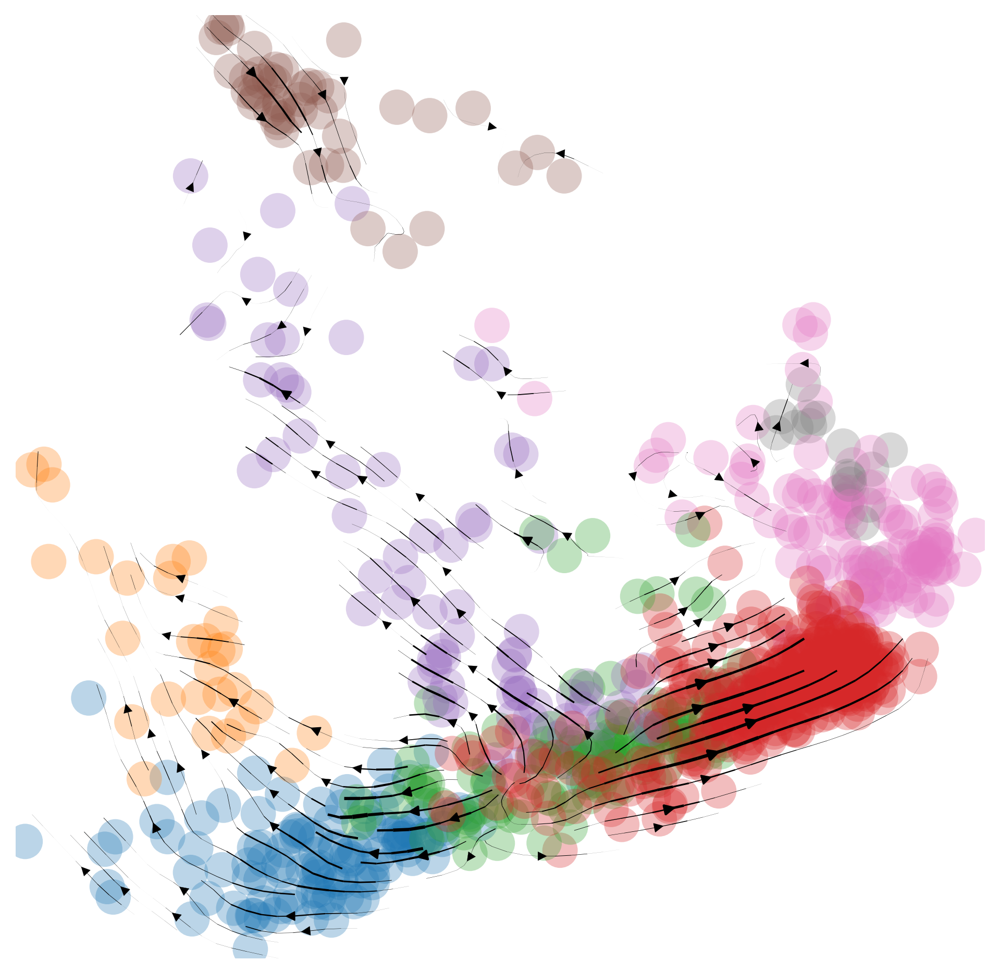

In [6]:
scv.pl.velocity_embedding_stream(adata_velo,basis = "pca", legend_loc='',legend_fontsize = 'small', title = "", color = 'louvain_semisup', dpi = 300,\
                                 save = "velocity_semisup_no_labels.png")

In [5]:
#function to read gene modules
def read_modules(infile):
    gene_modules = {}
    with open(infile) as f:
        for line in f:
            info = line.split(':')
            genes = [gene.strip() for gene in info[1].split(',')]
            gene_modules[info[0]] = genes
    return gene_modules

gene_modules  = read_modules("../../output/gene_modules/all_data/plots/UnbiasedGMs_topCorr_DR.genemodules.txt")

In [3]:
def plot_gene(gene):
    #set plotting parameters
    plt.rcParams['figure.figsize']=(10,8)
    plt.rcParams['font.sans-serif'] = "Helvetica"
    # Then, "ALWAYS use sans-serif fonts"
    plt.rcParams['font.family'] = "sans-serif"
    plt.rcParams.update({'font.size': 22})
    upper = np.percentile(adata_velo.raw.X[:,adata_velo.raw.var_names ==gene],95)
    plt.rcParams.update({'font.size': 40})
    sc.pl.pca(adata_velo, size =1000, color = gene, vmax = upper,sort_order =True, save = gene + "_pca.png")

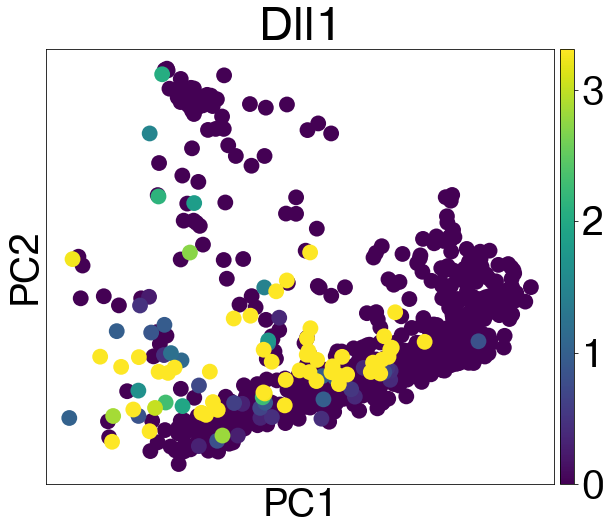

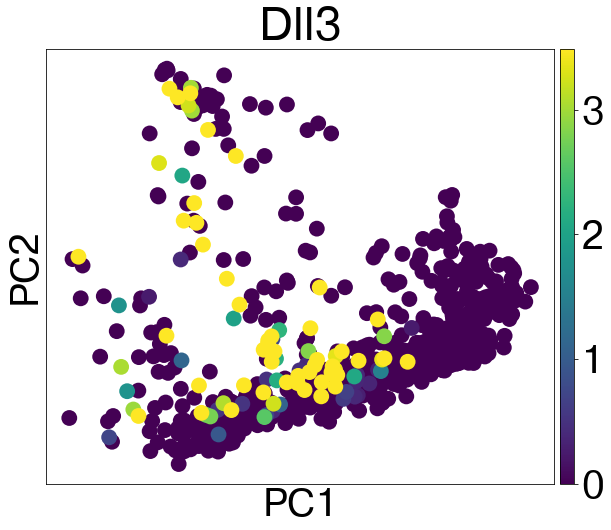

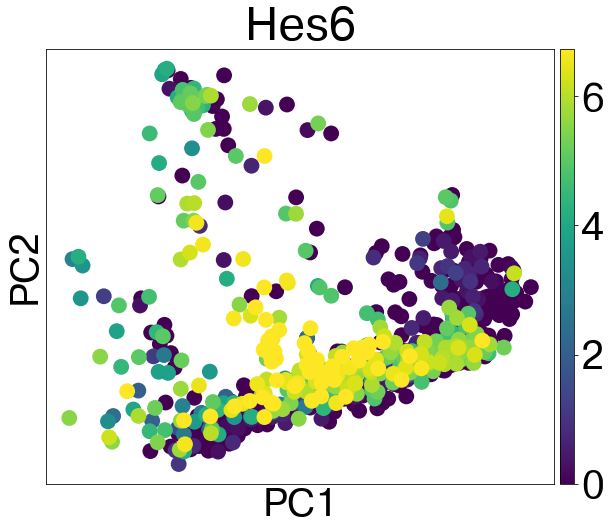

In [5]:
for gene in ["Dll1","Dll3","Hes6"]:
    plot_gene(gene)

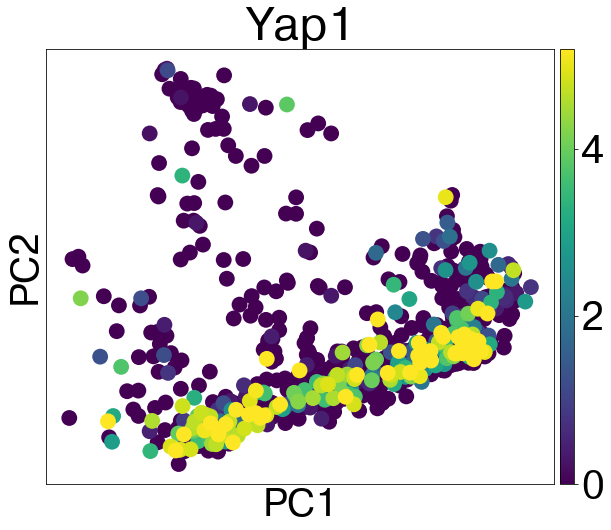

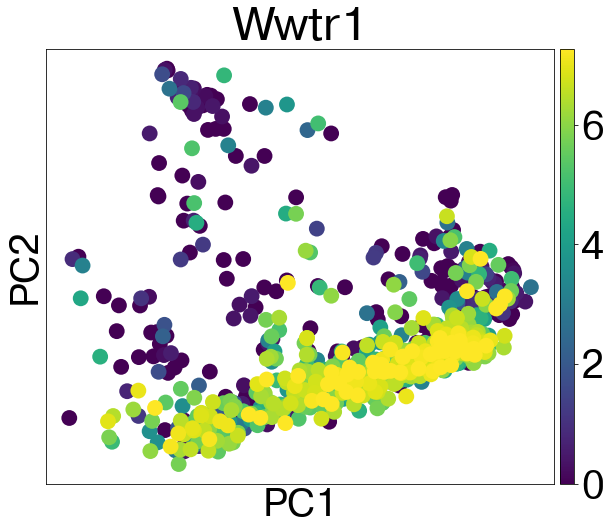

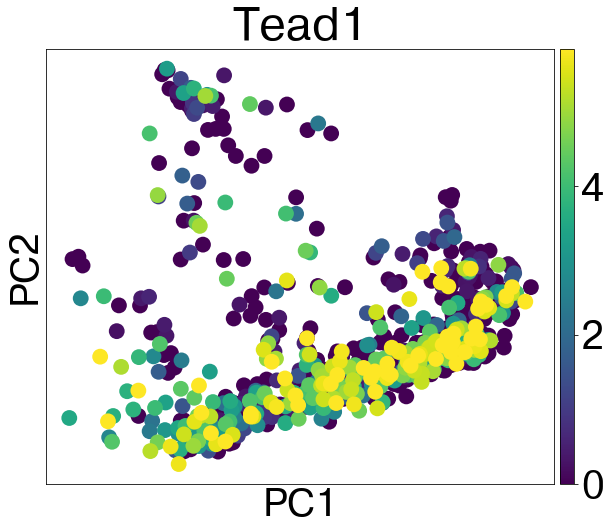

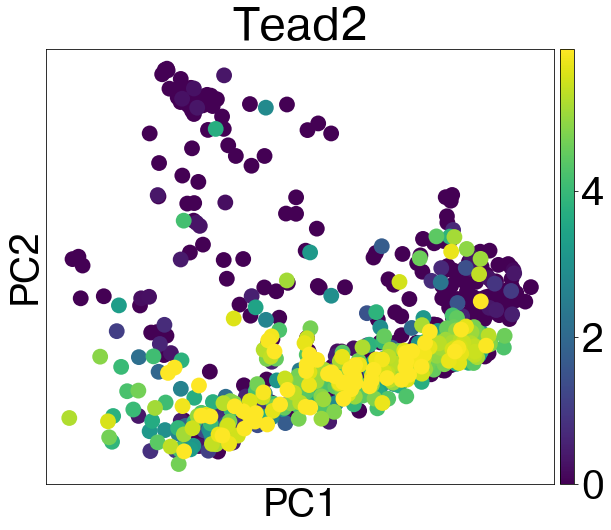

In [4]:
for gene in ["Yap1","Wwtr1","Tead1","Tead2"]:
    plot_gene(gene)

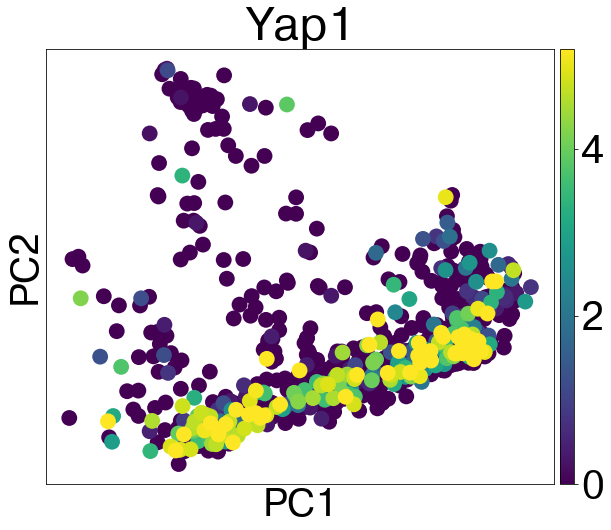

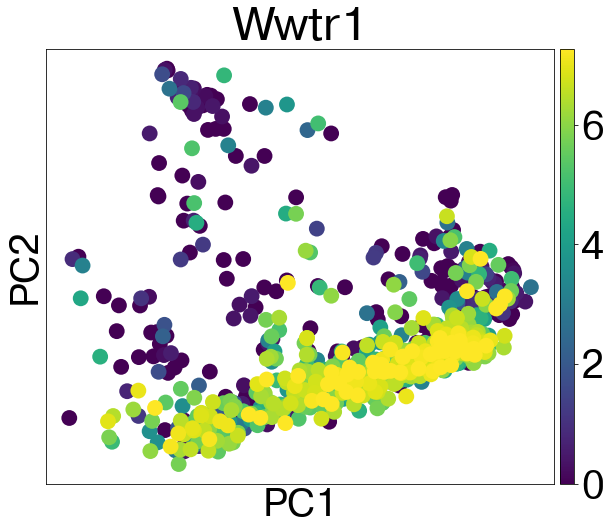

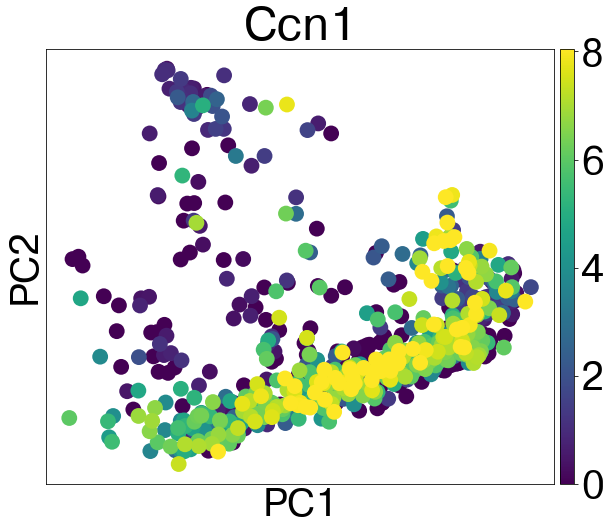

In [5]:
for gene in ["Yap1","Wwtr1","Ccn1"]:
    plot_gene(gene)

In [18]:
def plot_gene2(gene):
    #set plotting parameters
    plt.rcParams['figure.figsize']=(10,8)
    plt.rcParams['font.sans-serif'] = "Helvetica"
    # Then, "ALWAYS use sans-serif fonts"
    plt.rcParams['font.family'] = "sans-serif"
    plt.rcParams.update({'font.size': 22})
    upper = np.percentile(adata_velo.raw.X[:,adata_velo.raw.var_names ==gene],95)
    plt.rcParams.update({'font.size': 40})
    sc.pl.pca(adata_velo, size =1000, color = gene, vmax = upper,sort_order =True,frameon = False, title = None, save = gene + "_no_frame_pca.pdf", legend_loc = None)

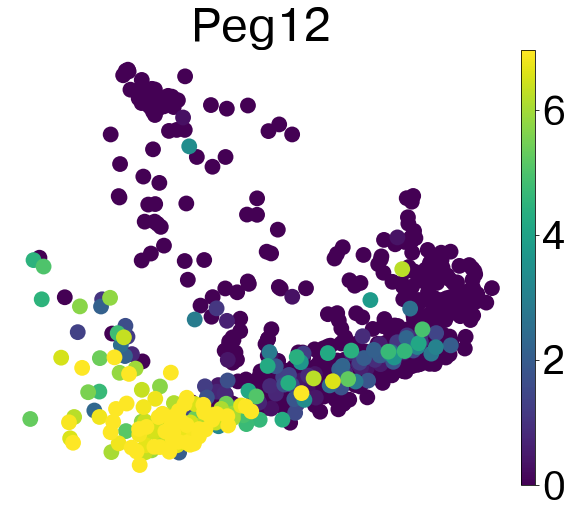

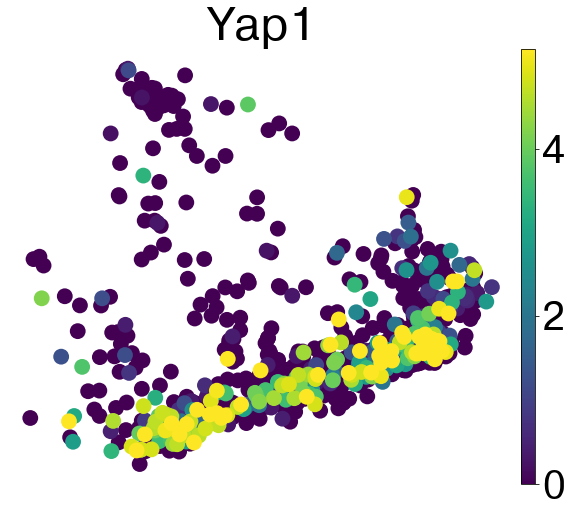

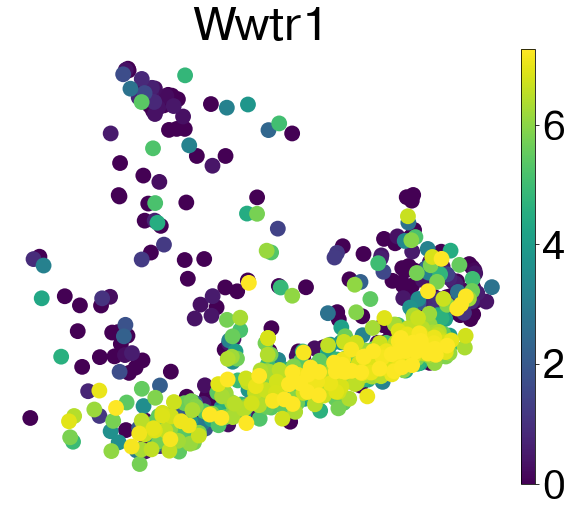

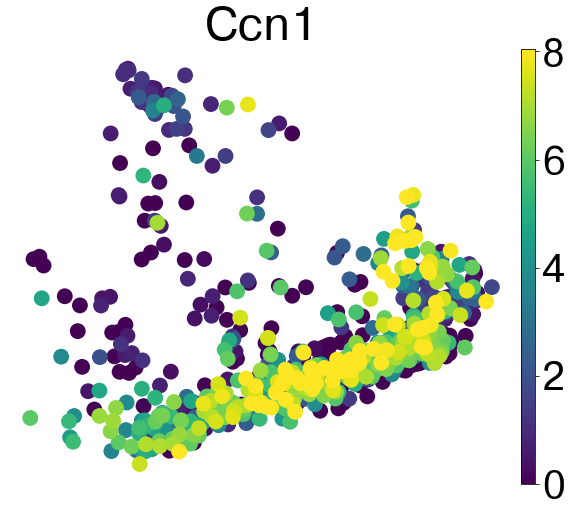

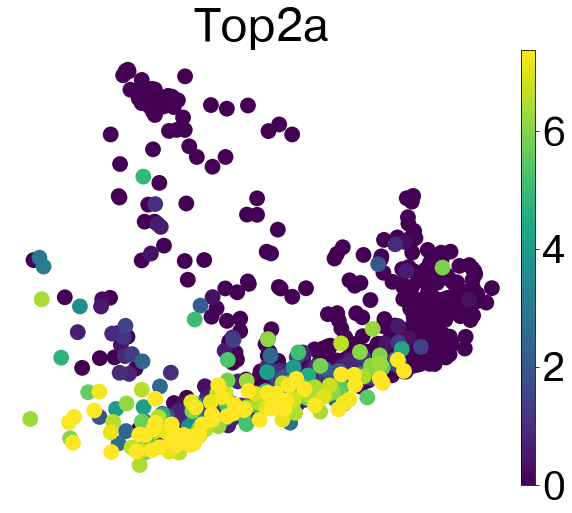

...

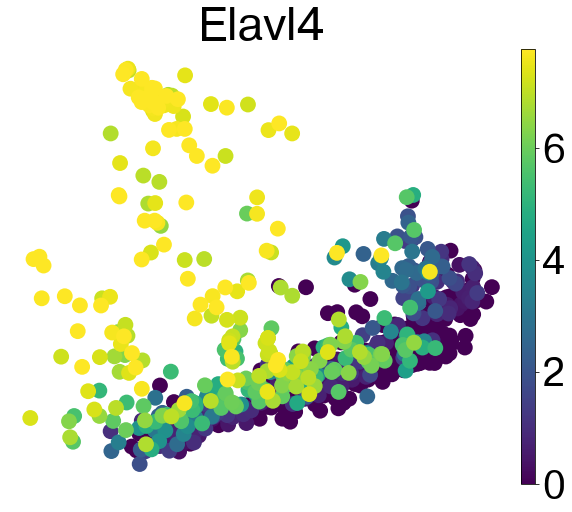

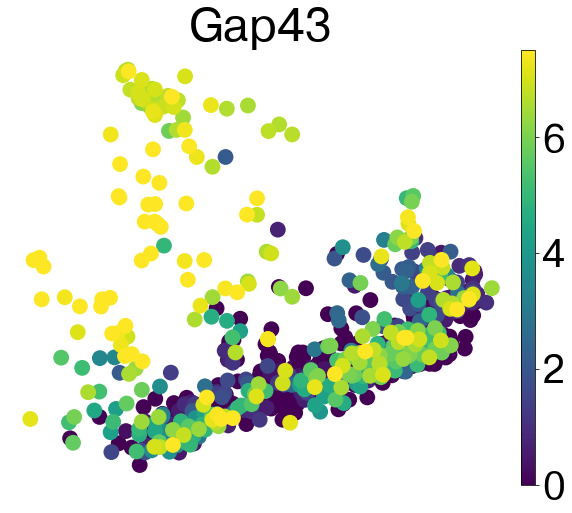

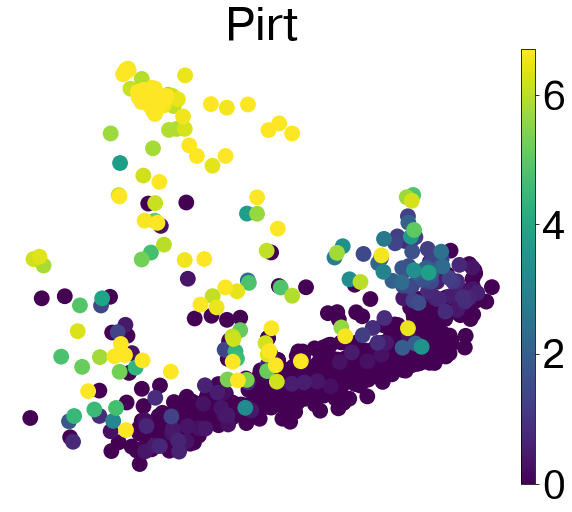

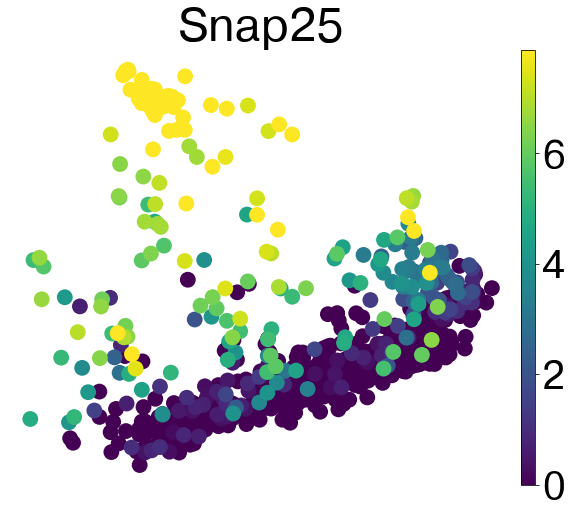

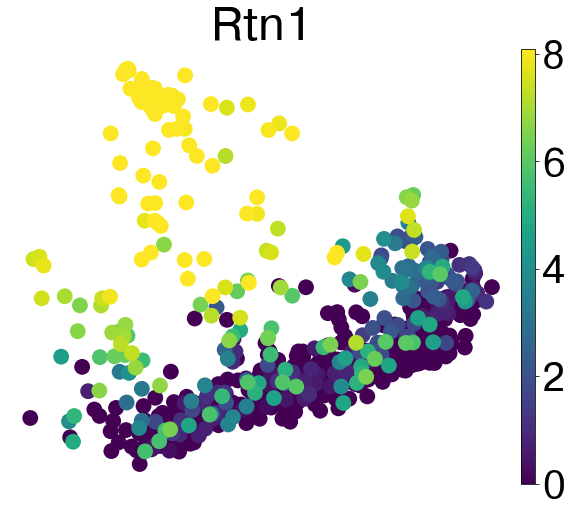

In [20]:
for gene in ["Peg12","Yap1","Wwtr1","Ccn1","Top2a","Apoe","Elavl4","Gap43","Pirt","Snap25","Rtn1"]:
    plot_gene2(gene)

In [13]:
print(sc.__version__)

1.4.4.post1


In [12]:
#set plotting parameters
plt.rcParams['figure.figsize']=(8,8)
plt.rcParams['font.sans-serif'] = "Helvetica"
# Then, "ALWAYS use sans-serif fonts"
plt.rcParams['font.family'] = "sans-serif"
plt.rcParams.update({'font.size': 22})

saving figure to file ./figures/scvelo_velocity_timepoint.png


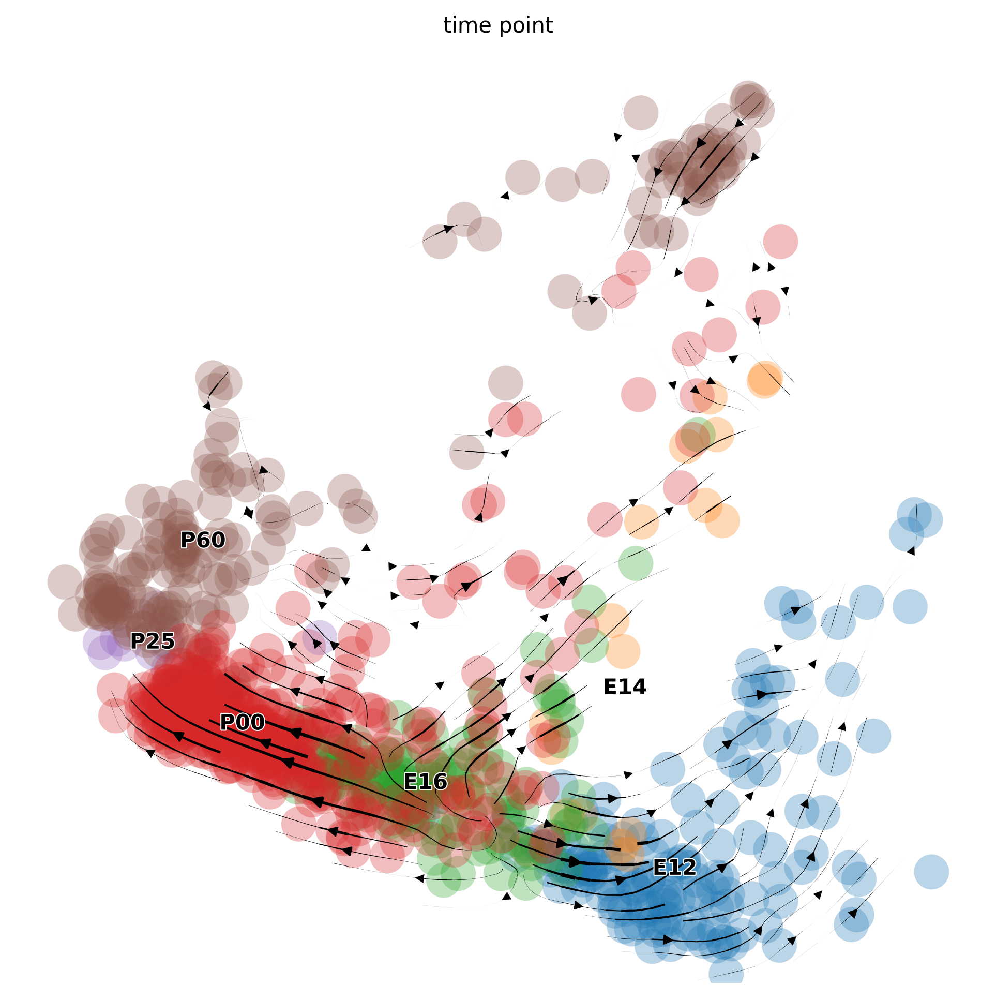

saving figure to file ./figures/scvelo_velocity_timepoint_v2.png


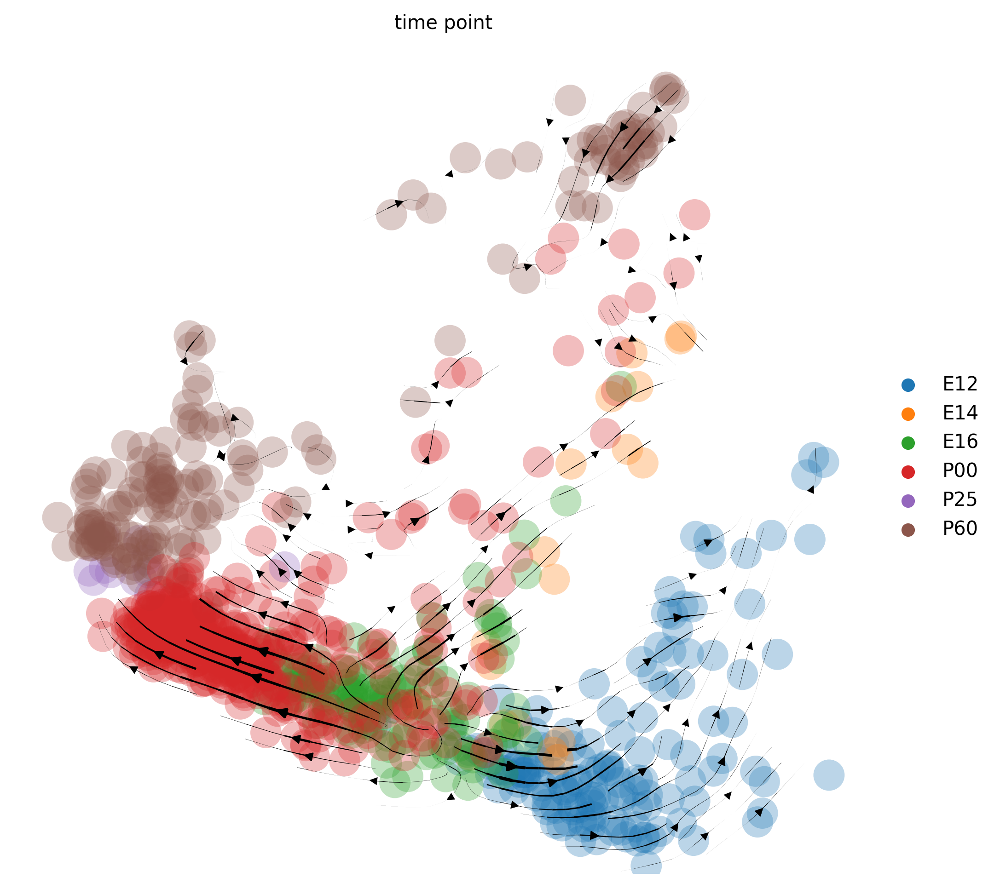

In [10]:
#create plot coloured by timepoint
scv.pl.velocity_embedding_stream(adata_velo,basis = "pca", legend_loc='on data', color = 'time_point',\
                                 dpi = 300,palette = sc.pl.palettes.vega_10, save = "velocity_timepoint.png")
scv.pl.velocity_embedding_stream(adata_velo,basis = "pca", legend_loc='right margin', color = 'time_point',\
                                 dpi = 300,palette = sc.pl.palettes.vega_10, save = "velocity_timepoint_v2.png")

In [11]:
#check how many genes were used for velocity calculations
sum(adata_velo.var.velocity_genes)

1222

In [20]:
scv.tl.rank_velocity_genes(adata_velo, match_with='louvain_r1.5')

import pandas as pd
velo_genes = pd.DataFrame(adata_velo.uns['rank_velocity_genes']['names']).head()

computing velocity clusters
    finished (0:00:00) --> added 
    'velocity_clusters', clusters based on modularity on velocity field (adata.obs)
ranking velocity genes
    finished (0:00:00) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns)


saving figure to file ./figures/scvelo_Late_1.2 7_scatter.png


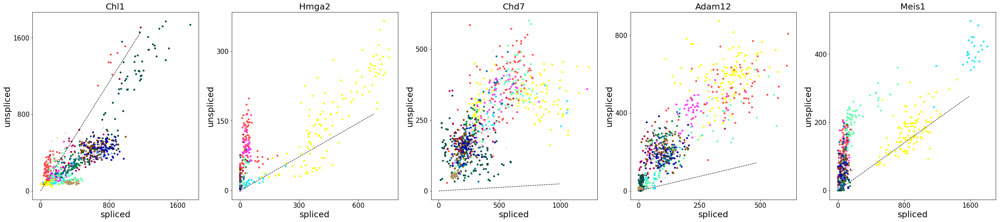

saving figure to file ./figures/scvelo_Late_1.1 2_scatter.png


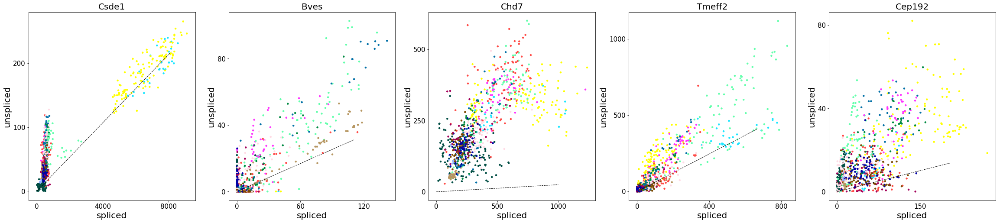

saving figure to file ./figures/scvelo_Late_2.6 1_scatter.png


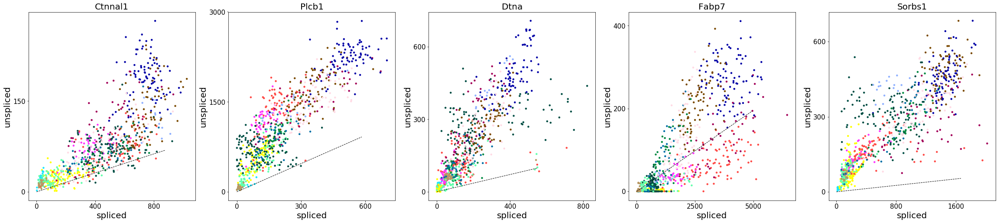

saving figure to file ./figures/scvelo_Late_neurons 9_scatter.png


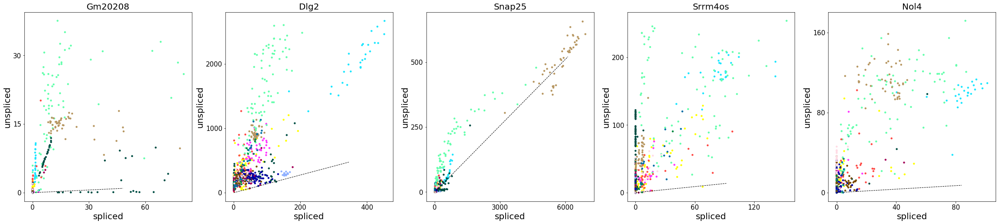

saving figure to file ./figures/scvelo_Late_2.5 3_scatter.png


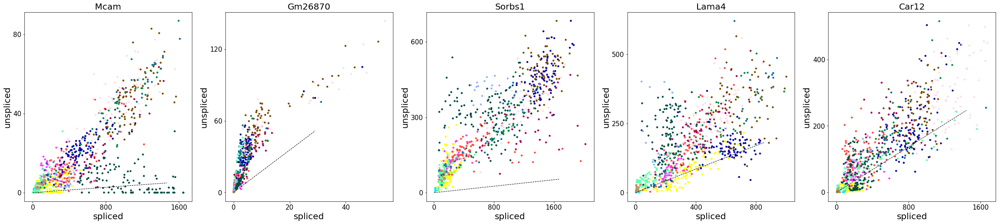

saving figure to file ./figures/scvelo_Glia_2 12_scatter.png


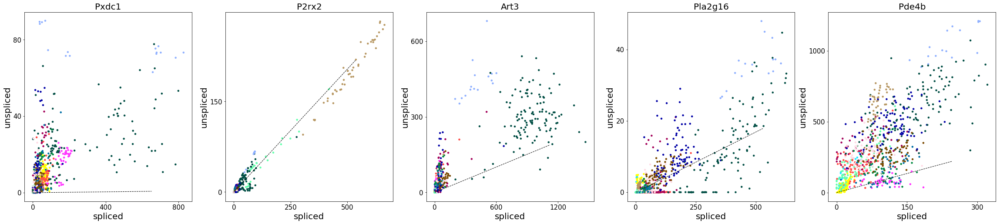

saving figure to file ./figures/scvelo_Early 5_scatter.png


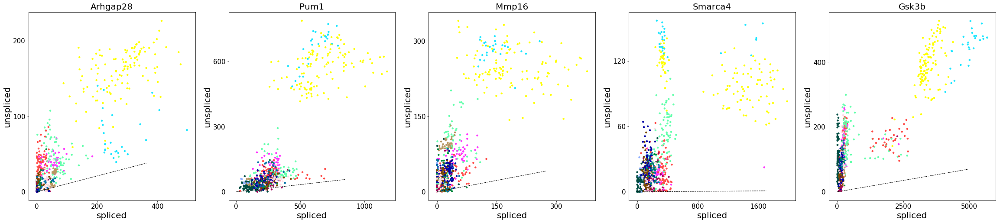

saving figure to file ./figures/scvelo_Adult_neurons 8_scatter.png


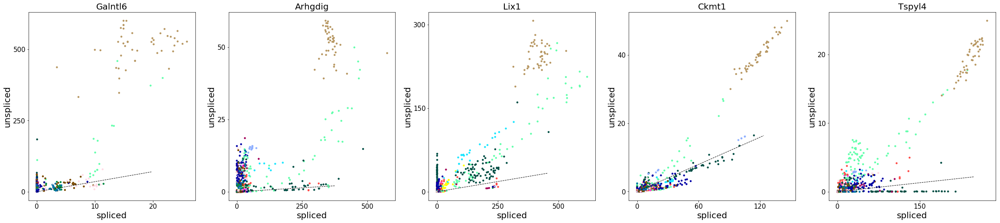

saving figure to file ./figures/scvelo_Late_2.3 6_scatter.png


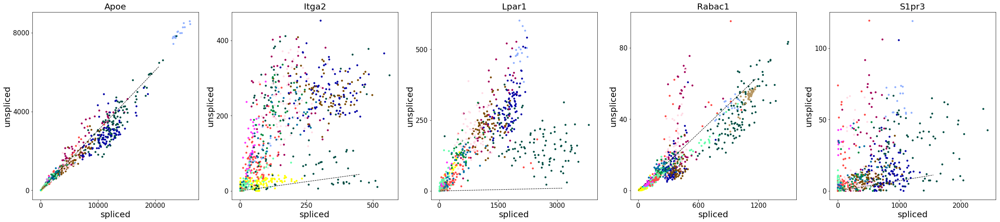

saving figure to file ./figures/scvelo_Early 10_scatter.png


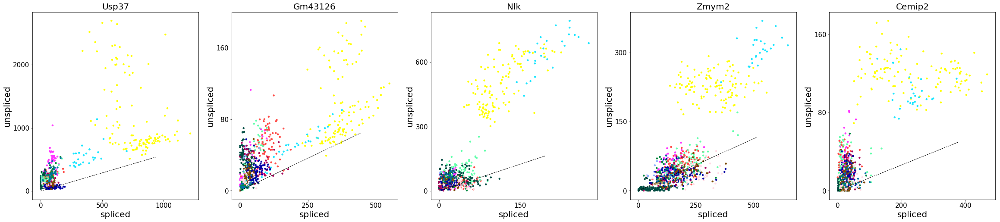

saving figure to file ./figures/scvelo_Glia_1 0_scatter.png


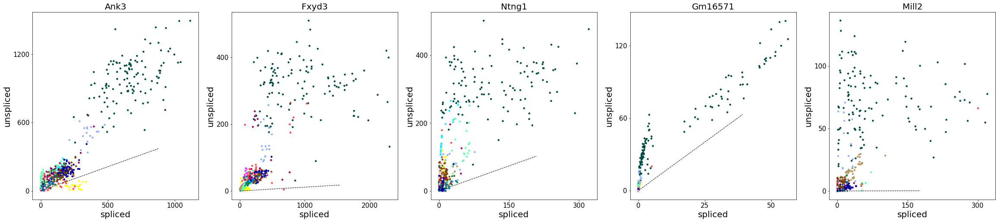

saving figure to file ./figures/scvelo_Early_neurons 11_scatter.png


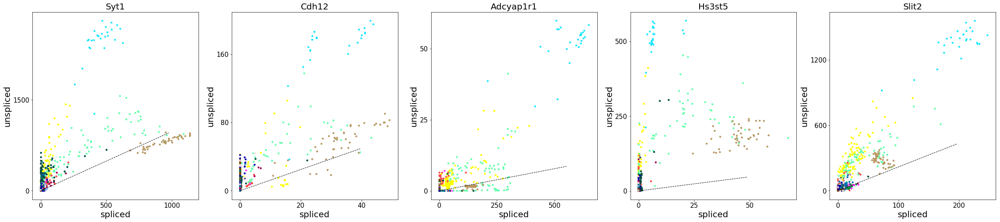

saving figure to file ./figures/scvelo_Late_2.4 4_scatter.png


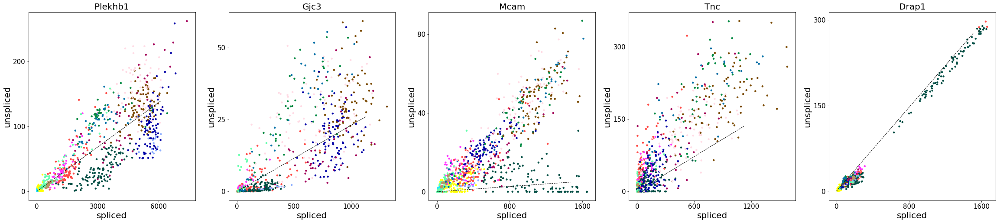

In [34]:
velo_genes

for cluster in set(velo_genes.columns):
    scv.pl.scatter(adata_velo, basis=list(velo_genes[cluster]), legend_loc='none',
               size=80, frameon=True, ncols=5, fontsize=20,color = 'louvain_r1.5', save = cluster + "_scatter.png")

In [17]:
scv.tl.rank_velocity_genes(adata_velo)

computing velocity clusters
    finished (0:00:00) --> added 
    'velocity_clusters', clusters based on modularity on velocity field (adata.obs)
ranking velocity genes
    finished (0:00:00) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns)


In [18]:
velo_genes = pd.DataFrame(adata_velo.uns['rank_velocity_genes']['names']).head()

In [19]:
velo_genes

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,Ank3,Ctnnal1,Csde1,Mcam,Plekhb1,Arhgap28,Apoe,Chl1,Galntl6,Gm20208,Usp37,Syt1,Pxdc1
1,Fxyd3,Plcb1,Bves,Gm26870,Gjc3,Pum1,Itga2,Hmga2,Arhgdig,Dlg2,Gm43126,Cdh12,P2rx2
2,Ntng1,Dtna,Chd7,Sorbs1,Mcam,Mmp16,Lpar1,Chd7,Lix1,Snap25,Nlk,Adcyap1r1,Art3
3,Gm16571,Fabp7,Tmeff2,Lama4,Tnc,Smarca4,Rabac1,Adam12,Ckmt1,Srrm4os,Zmym2,Hs3st5,Pla2g16
4,Mill2,Sorbs1,Cep192,Car12,Drap1,Gsk3b,S1pr3,Meis1,Tspyl4,Nol4,Cemip2,Slit2,Pde4b


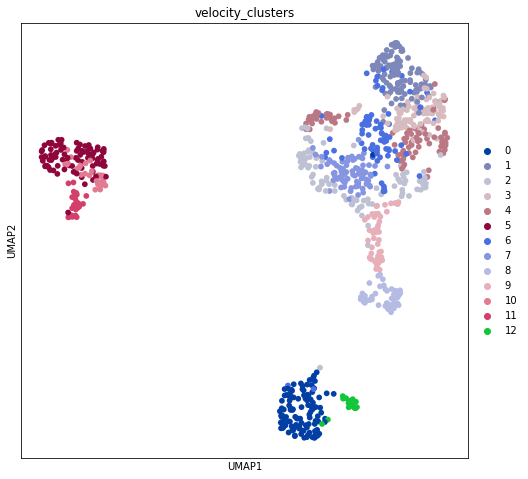

In [21]:
sc.pl.umap(adata_velo, color=['velocity_clusters'])

saving figure to file ./figures/scvelo_4_vc_scatter.png


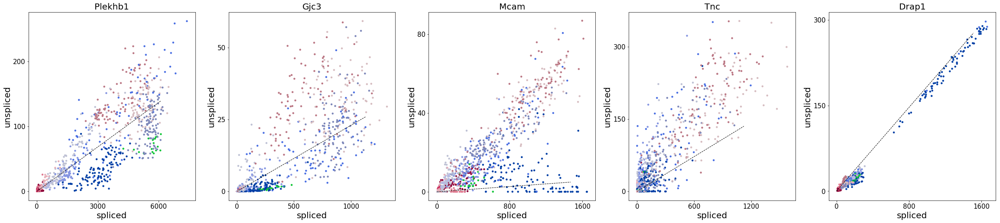

saving figure to file ./figures/scvelo_6_vc_scatter.png


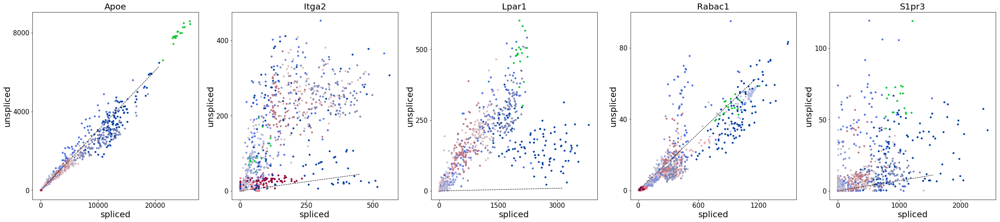

saving figure to file ./figures/scvelo_0_vc_scatter.png


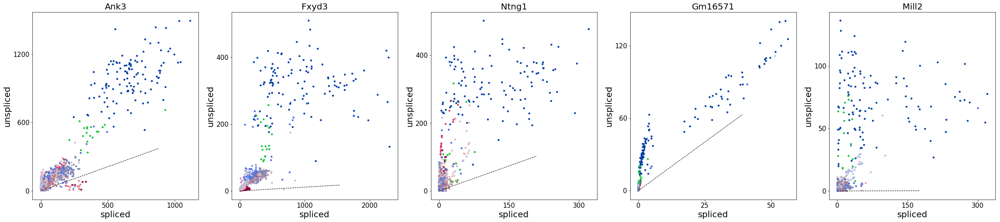

saving figure to file ./figures/scvelo_7_vc_scatter.png


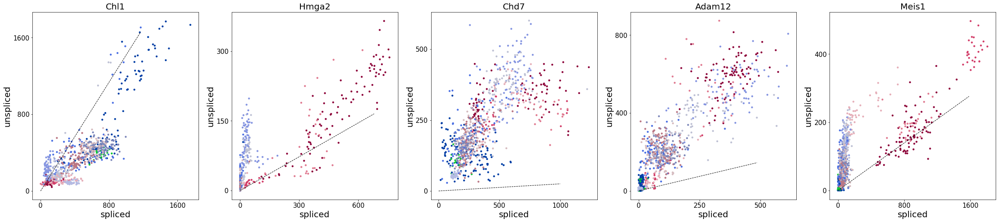

saving figure to file ./figures/scvelo_9_vc_scatter.png


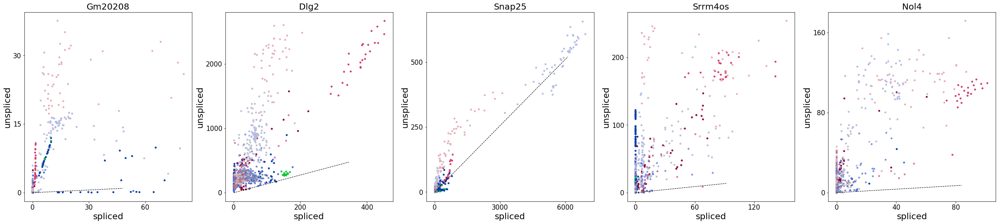

saving figure to file ./figures/scvelo_11_vc_scatter.png


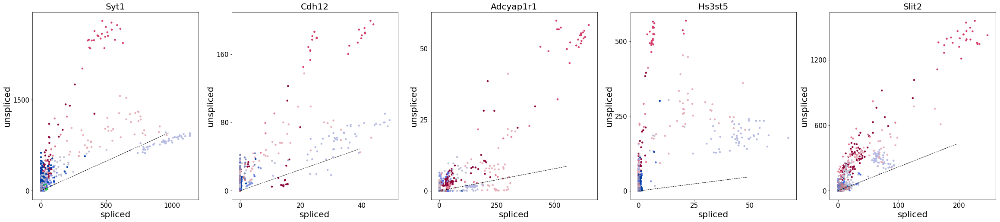

saving figure to file ./figures/scvelo_1_vc_scatter.png


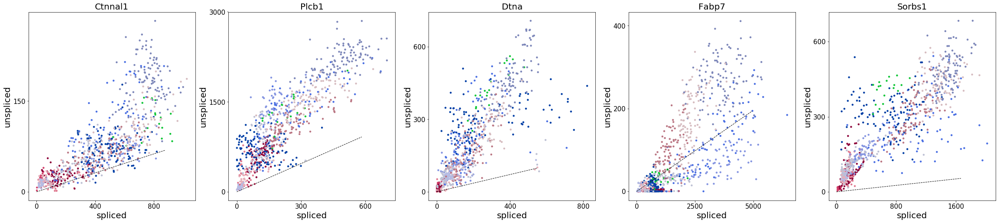

saving figure to file ./figures/scvelo_8_vc_scatter.png


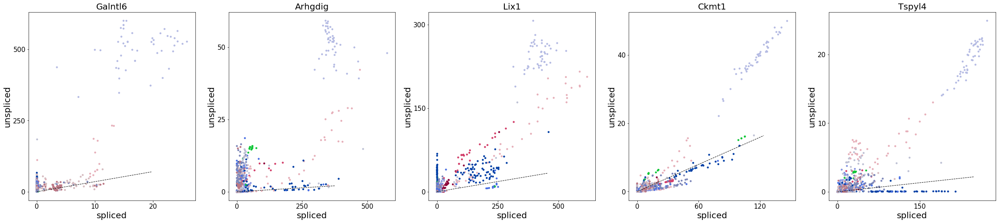

saving figure to file ./figures/scvelo_10_vc_scatter.png


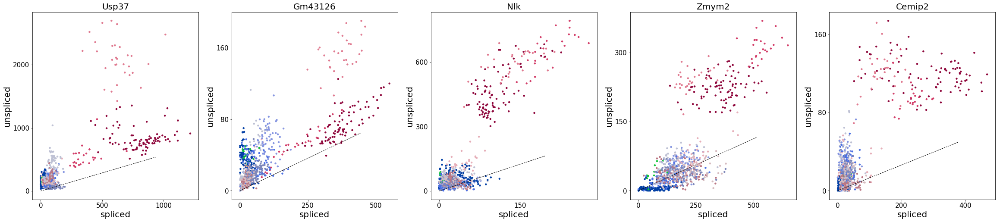

saving figure to file ./figures/scvelo_12_vc_scatter.png


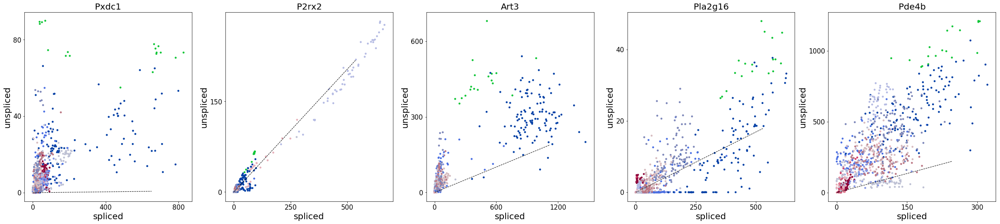

saving figure to file ./figures/scvelo_2_vc_scatter.png


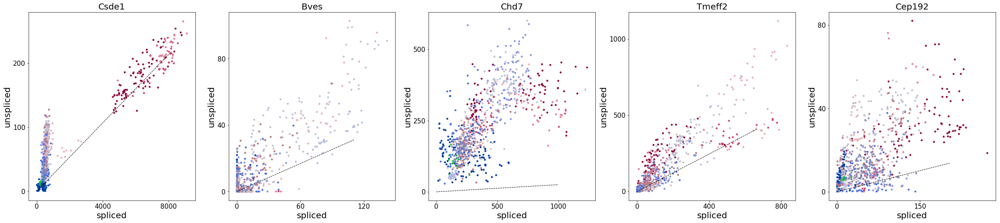

saving figure to file ./figures/scvelo_5_vc_scatter.png


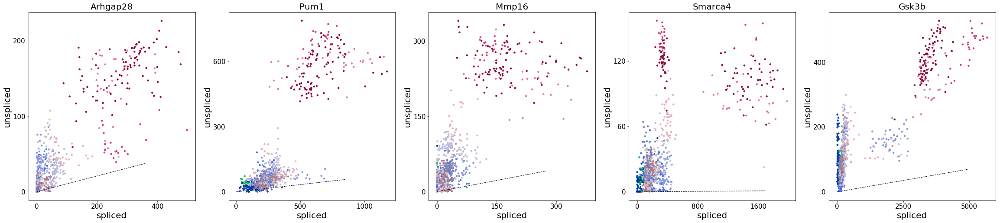

saving figure to file ./figures/scvelo_3_vc_scatter.png


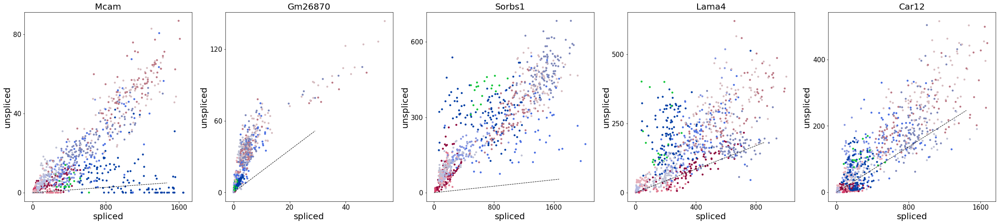

In [22]:
velo_genes

for cluster in set(velo_genes.columns):
    scv.pl.scatter(adata_velo, basis=list(velo_genes[cluster]), legend_loc='none',
               size=80, frameon=True, ncols=5, fontsize=20,color = 'velocity_clusters', save = cluster + "_vc_scatter.png")

In [12]:
scv.tl.velocity_clusters(adata_velo)

computing velocity clusters
    finished (0:00:00) --> added 
    'velocity_clusters', clusters based on modularity on velocity field (adata.obs)


In [32]:
list(velo_genes['Glia_1 0'])

['Ank3', 'Fxyd3', 'Ntng1', 'Gm16571', 'Mill2']

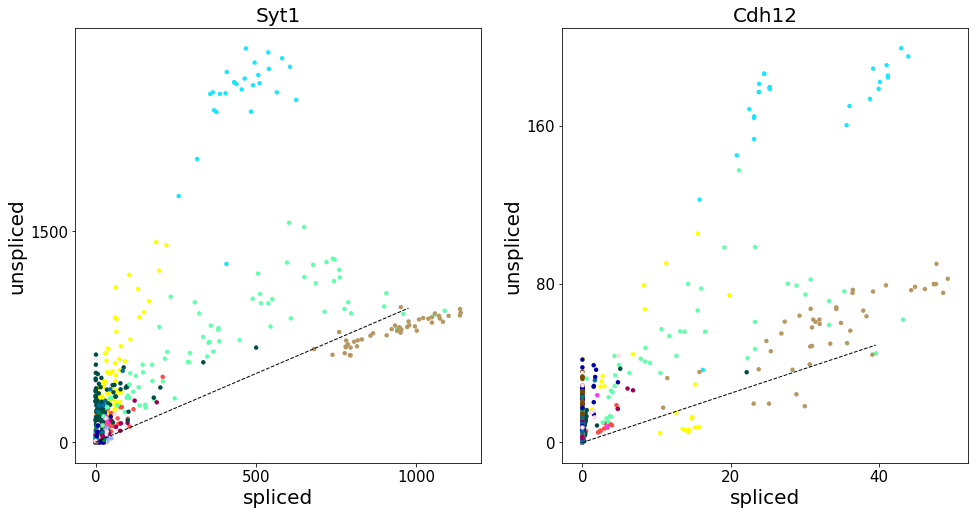

In [16]:
scv.pl.scatter(adata_velo, basis=['Syt1','Cdh12'], legend_loc='none',
               size=80, frameon=True, ncols=5, fontsize=20,color = 'louvain_r1.5')

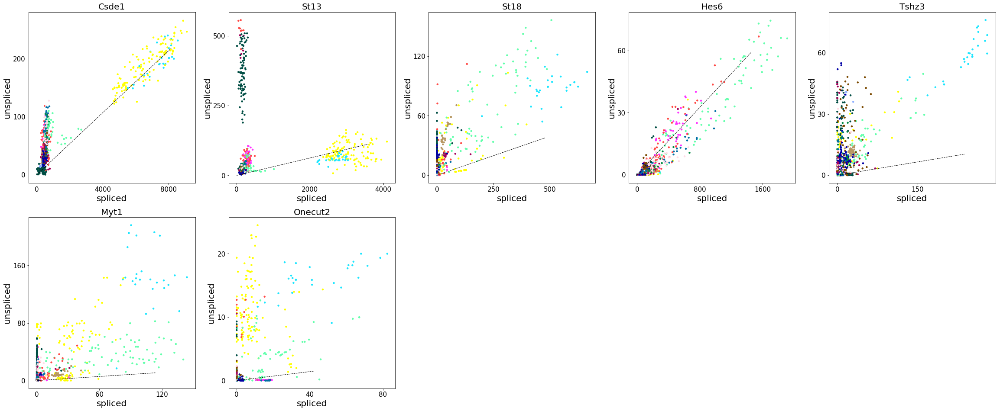

In [17]:
scv.pl.scatter(adata_velo, basis=['Csde1','St13','St18','Sox11','Hes6','Tshz3','Myt1','Onecut2'], legend_loc='none',
               size=80, frameon=True, ncols=5, fontsize=20,color = 'louvain_r1.5')

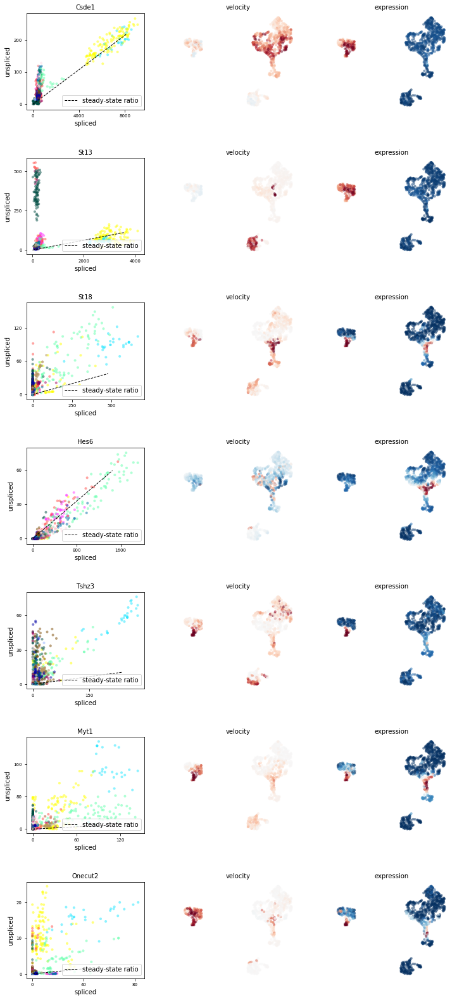

In [14]:
scv.pl.velocity(adata_velo, var_names=['Csde1','St13','St18','Sox11','Hes6','Tshz3','Myt1','Onecut2'],
               color = 'louvain_r1.5')

In [11]:
#change from unsigned int to float32 for conversion to R
adata_cc.layers['unspliced'] = adata_cc.layers['unspliced'].astype("float32")
adata_cc.layers['spliced'] = adata_cc.layers['spliced'].astype("float32")
adata_cc.layers['counts'] = adata_cc.layers['counts'].astype("float32")

In [12]:
#filter pcs for the first 15 to be used for pseudotime
adata_cc.obsm['X_pca'] = adata_cc.obsm['X_pca'][:,0:15]

Trajectory inference using Slingshot

In [25]:
%%R -i adata_cc

adata_start = slingshot(adata_cc, clusterLabels = 'louvain_r1.5', reducedDim = 'PCA', start.clus='Early')
print(SlingshotDataSet(adata_start))

class: SlingshotDataSet 

 Samples Dimensions
     904         15

lineages: 4 
Lineage1: Early  Late_1.2  Late_2.3  Late_2.6  Late_2.5  Late_2.4  Late_2.1  Late_2.2  Late_1.1  
Lineage2: Early  Late_1.2  Late_neurons  Adult_neurons  
Lineage3: Early  Late_1.2  Glia_1  Glia_2  
Lineage4: Early  Early_neurons  

curves: 4 
Curve1: Length: 202.03	Samples: 605.05
Curve2: Length: 231.82	Samples: 303.96
Curve3: Length: 199.79	Samples: 327.96
Curve4: Length: 149.47	Samples: 138.24


In [26]:
%%R

#function to plot lineage
plot_lineage = function(adata, lineage, name){
    colors = colorRampPalette(brewer.pal(11,'Spectral')[-6])(100)
    png(paste0("../../output/slingshot/",name,"_",lineage,".png"),
       width=5, height=5, units="in", res=300)
    plot(reducedDims(adata)$PCA[,c(1,2)], 
    col = colors[cut(adata[[paste0("slingPseudotime_", lineage)]],breaks=100)], 
    pch=16, asp = 1, xlab='PC1', ylab='PC2')
    lines(slingCurves(adata)[[paste0("curve",lineage)]], lwd=2)
    dev.off()      
}

In [27]:
%%R

#plot lineages
for (i in 1:4)
    plot_lineage(adata_start, i, 'adata_start_louvain_r1.5')


#plot lineages combined
#set cluster names
clusters= c("Early","Early_neurons","Late_1.1","Late_1.2","Late_2.1","Late_2.2","Late_2.3","Late_2.4",
                                 "Late_2.5","Late_2.6","Late_neurons","Adult_neurons","Glia_1","Glia_2")

#set colours
colour_palette = c('#ffff00','#1ce6ff','#ff34ff','#ff4a46','#008941','#006fa6', '#a30059','#ffdbe5','#7a4900',
                   '#0000a6','#63ffac','#b79762','#004d43','#8fb0ff')
#make plot
png("../../output/slingshot/adata_start_louvain_r1.5.png",
       width=6, height=6, units="in", res=300)
par(xpd=TRUE,mar=par()$mar+c(0,0,0,7))
plot(reducedDims(adata_start)$PCA[,c(1,2)], col = colour_palette[adata_start$louvain_r1.5], pch=16, asp = 1, bty='L', xlab='PC1', ylab='PC2')
lines(SlingshotDataSet(adata_start), lwd=2, type='lineages')
legend(80,80, legend=clusters, fill=colour_palette)
par(mar=c(5, 4, 4, 2) + 0.1)
dev.off()

#save trajectory
saveRDS(adata_start,'../../output/slingshot/adata_start_louvain_1.5.rds')

A glial (lineage 2) and neuronal lineages (lineage 3 and lineage 4) can clearly be seen, however lineage 1 seems slightly spurious as it folds back on itself and ends at a less mature cell state (from a primarily P00 clusters in the middle of the lineage to primarily E16 cluster at the end).

Slingshot states (https://bioconductor.org/packages/release/bioc/vignettes/slingshot/inst/doc/vignette.html):

"The clusters identified in this step will be used to determine the global structure of the underlying lineages (that is, their number, when they branch off from one another, and the approximate locations of those branching events). This is different than the typical goal of clustering single-cell data, which is to identify all biologically relevant cell types present in the dataset. For example, when determining global lineage structure, there is no need to distinguish between immature and mature neurons since both cell types will, presumably, fall along the same segment of a lineage."

Singshot also states, if "there is an abundance of small clusters, we may begin to see spurious branching events."

Therefore let's try to merge clusters which appear to form a continuum to avoid spurious branching. Also as both adult glial clusters are clearly part of the glial lineage, however any transition between these is a cell state rather than developmental transition, and, given the small number of cells in the glia 2 cluster, let's merge these.

In [28]:
#merge all late 1 clusters and merge all late 2 clusters and merge adult glial clusterse
adata_cc.obs["louvain_semisup"] = list(adata_cc.obs["louvain_r1.5"])
adata_cc.obs["louvain_semisup"][adata_cc.obs["louvain_semisup"].isin(['Late_2.1','Late_2.2','Late_2.3','Late_2.4','Late_2.5','Late_2.6'])] = "Late_2"
adata_cc.obs["louvain_semisup"][adata_cc.obs["louvain_semisup"].isin(['Late_1.1','Late_1.2'])] = "Late_1"
adata_cc.obs["louvain_semisup"][adata_cc.obs["louvain_semisup"].isin(['Glia_1','Glia_2'])] = "Glia"

In [29]:
%%R -i adata_cc

adata_cc$louvain_semisup = as.factor(adata_cc$louvain_semisup)

adata_start_semisup <- slingshot(adata_cc, clusterLabels = 'louvain_semisup', reducedDim = 'PCA', start.clus='Early')
print(SlingshotDataSet(adata_start_semisup))

class: SlingshotDataSet 

 Samples Dimensions
     904         15

lineages: 3 
Lineage1: Early  Late_1  Late_neurons  Adult_neurons  
Lineage2: Early  Late_1  Late_2  Glia  
Lineage3: Early  Early_neurons  

curves: 3 
Curve1: Length: 220.1	Samples: 329.43
Curve2: Length: 182.82	Samples: 697.65
Curve3: Length: 163.04	Samples: 142.57


In [30]:
%%R

#plot lineages
for (i in 1:3)
    plot_lineage(adata_start_semisup, i, 'adata_start_louvain_semisup')

#make plot
png("../../output/slingshot/adata_start_louvain_semisup.png",
       width=6, height=6, units="in", res=300)
par(xpd=TRUE,mar=par()$mar+c(0,0,0,7))
plot(reducedDims(adata_start_semisup)$PCA[,c(1,2)], col = colour_palette[adata_start_semisup$louvain_r1.5], pch=16, asp = 1, bty='L', xlab='PC1', ylab='PC2')
lines(SlingshotDataSet(adata_start_semisup), lwd=2, type='lineages')
legend(80,80, legend=clusters, fill=colour_palette)
par(mar=c(5, 4, 4, 2) + 0.1)
dev.off()

#save trajectory
saveRDS(adata_start_semisup,'../../output/slingshot/adata_start_louvain_semisup.rds')

[1] 2
